# 尝试在乔哥的图片上找到黑白两色的颗粒

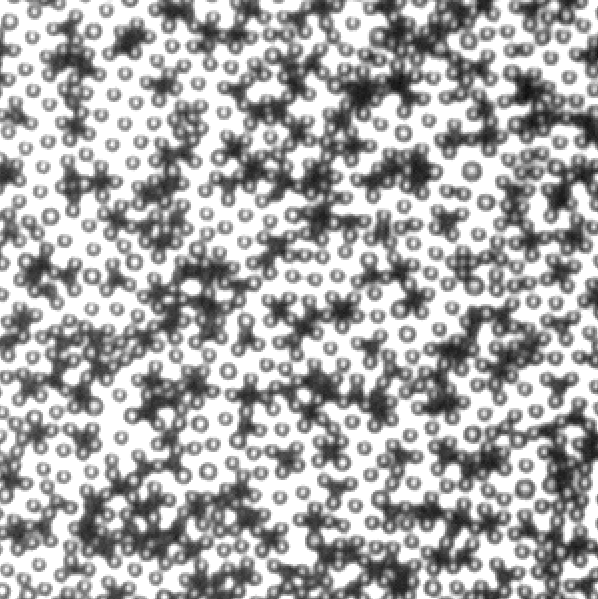

首先试了试ImageJ的Trackmate插件，用LoG方法（7 pixel，threshold 10）可以得到如下效果。这个方法两色的颗粒都能找到一些，但黑色颗粒位置相对准确，白色颗粒位置有些偏，原因是这个方法是在图片里找类似gaussian的峰，所以白色的颗粒的边缘会被当做中心。所以我们可以基于这个方法的结果，挑选出黑色颗粒，即在下图中亮度总和高的区域。白色区域则用一个类似Mexican hat的图案重新找出。

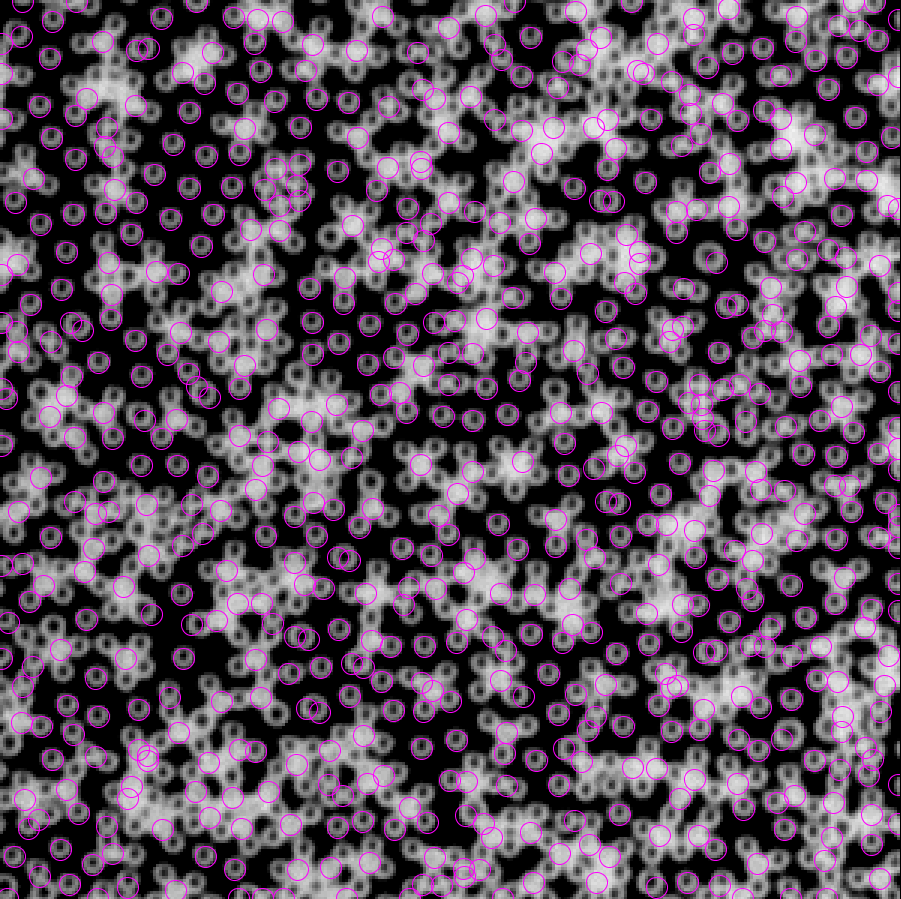

## 1 用Python代码实现TrackMate的LoG方法（非完全复现，没有细节，只有基本思路）。

In [2]:
from skimage import io
import matplotlib.pyplot as plt
import numpy as np

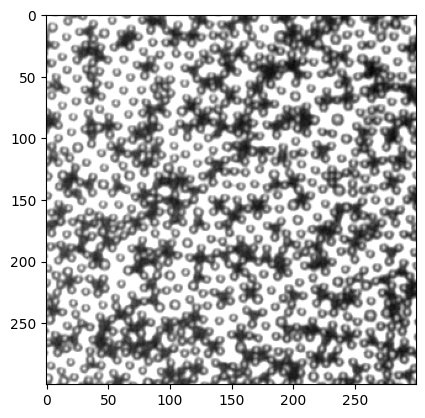

In [3]:
img = io.imread("try0000_imj.tif")
plt.imshow(img, cmap="gray")

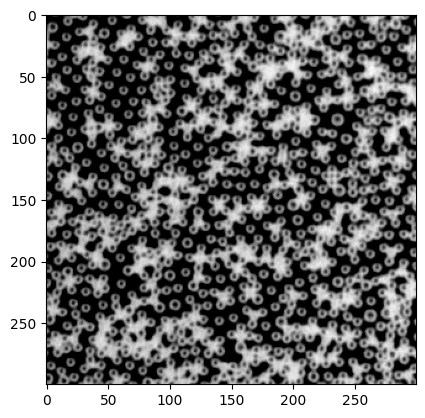

In [4]:
# invert image
inv_img = 255 - img
plt.imshow(inv_img, cmap="gray")

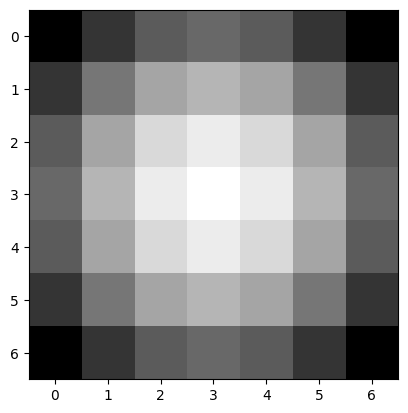

In [39]:
# generate a gaussian mask 
from myImageLib import matlab_style_gauss2D
# matlab_style_gauss2D(shape=(3,3),sigma=0.5)
gauss_mask = matlab_style_gauss2D(shape=(7,7),sigma=3.5)
plt.imshow(gauss_mask, cmap="gray")

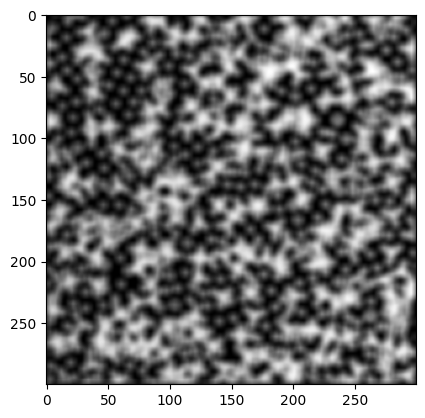

In [40]:
# treat the image with the mask first
from scipy.signal import convolve2d
timg = convolve2d(inv_img, gauss_mask, mode="same")
plt.imshow(timg, cmap="gray")

In [41]:
gauss_mask.shape

(7, 7)

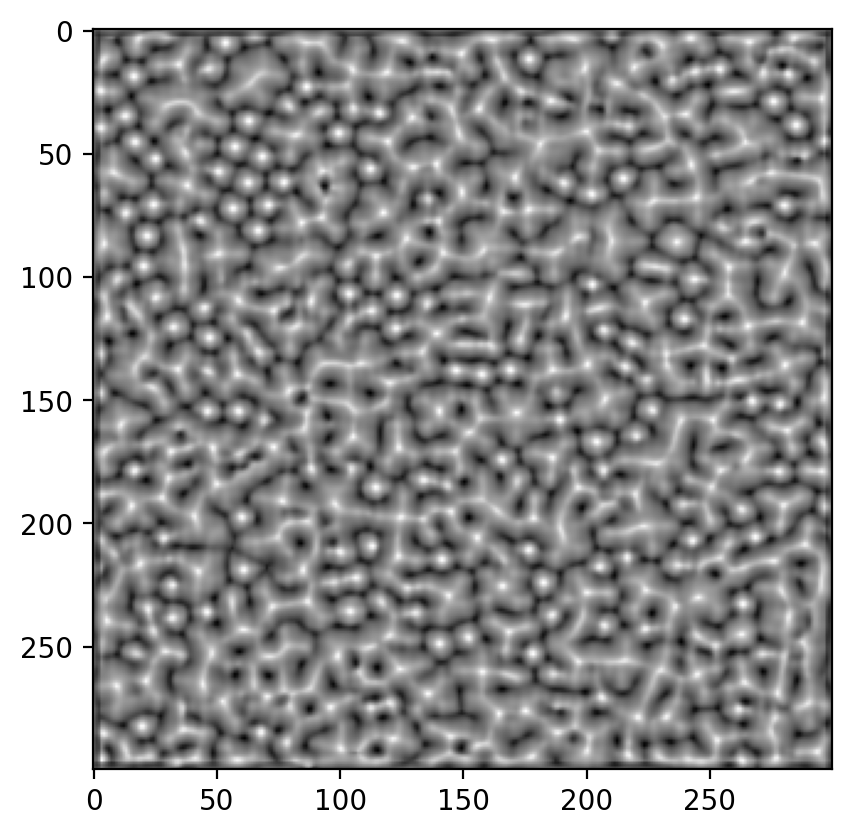

In [42]:
# compute correlation map between inv_img and gauss_mask
from xcorr_funcs import normxcorr2
corr = normxcorr2(gauss_mask, timg, "same")
plt.figure(dpi=200)
plt.imshow(corr, cmap="gray")

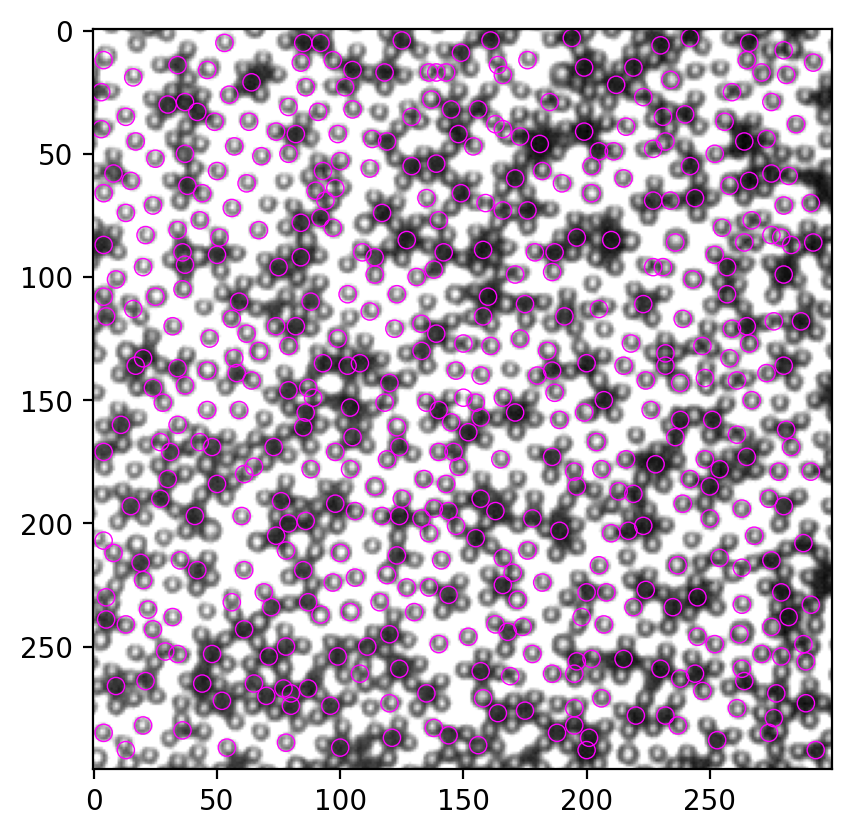

In [49]:
# find peaks on the correlation map corr
from xcorr_funcs import FastPeakFind
from matplotlib.patches import Circle
peak = FastPeakFind(corr)
fig, ax = plt.subplots(dpi=200)
ax.imshow(img, cmap="gray")
for y, x in peak.T:
    circ = Circle((x, y), radius=3.5, ec="magenta", fill=False, lw=0.5)
    ax.add_patch(circ)

Put the TrackMate result and Python result side by side. It's not a faithful replication, but I think most black particles are correctly located.

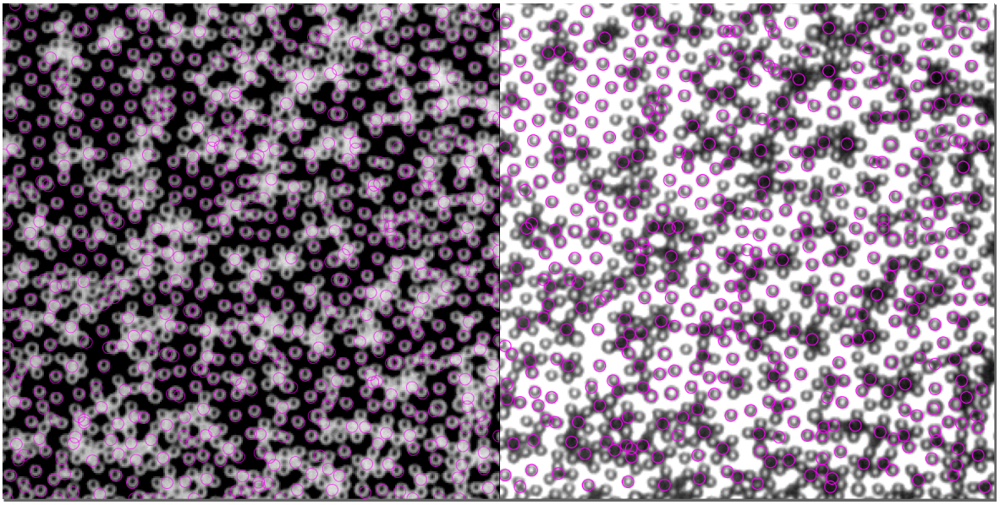

# 2 区分黑白颗粒

第一个想法是看找到的颗粒里的像素值总和，黑颗粒应该远小于白颗粒。

In [46]:
# generate coords matrices
img = io.imread("try0000_imj.tif")
Y, X = np.mgrid[0:img.shape[0], 0:img.shape[1]]

In [51]:
# iterate over all the detected particle coords, compute total pixel values
R = 3.5
pixel_sum_list = []
for y, x in peak.T:
    mask = (X - x) ** 2 + (Y - y) ** 2 < R ** 2
    pv = img[mask].sum()
    pixel_sum_list.append(pv)

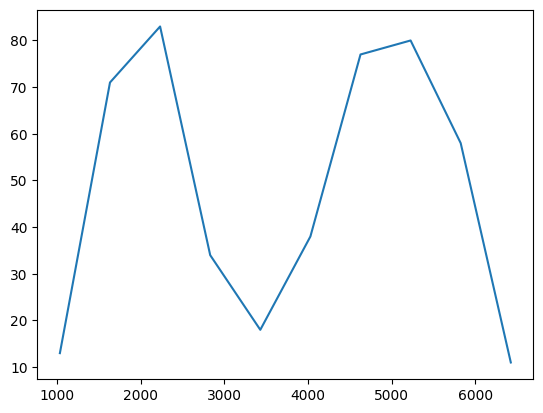

In [53]:
# histogram of pixel values, expect a binodal distribution
hist, bin_edges = np.histogram(np.array(pixel_sum_list))
plt.plot(bin_edges[:-1], hist)

确实是两个峰，非常beautiful。我们的目标是找黑色particle，所以取第一个峰内的所有点即可。这里我手动设置一个阈值3500，作为两个峰的分界点，取所有像素值总和在3500以下的颗粒作为黑色颗粒。

In [56]:
# for my convenience, I genenerate a DataFrame to manipulate the data
import pandas as pd
particles = pd.DataFrame({"x": peak[1], "y": peak[0], "pv": pixel_sum_list})

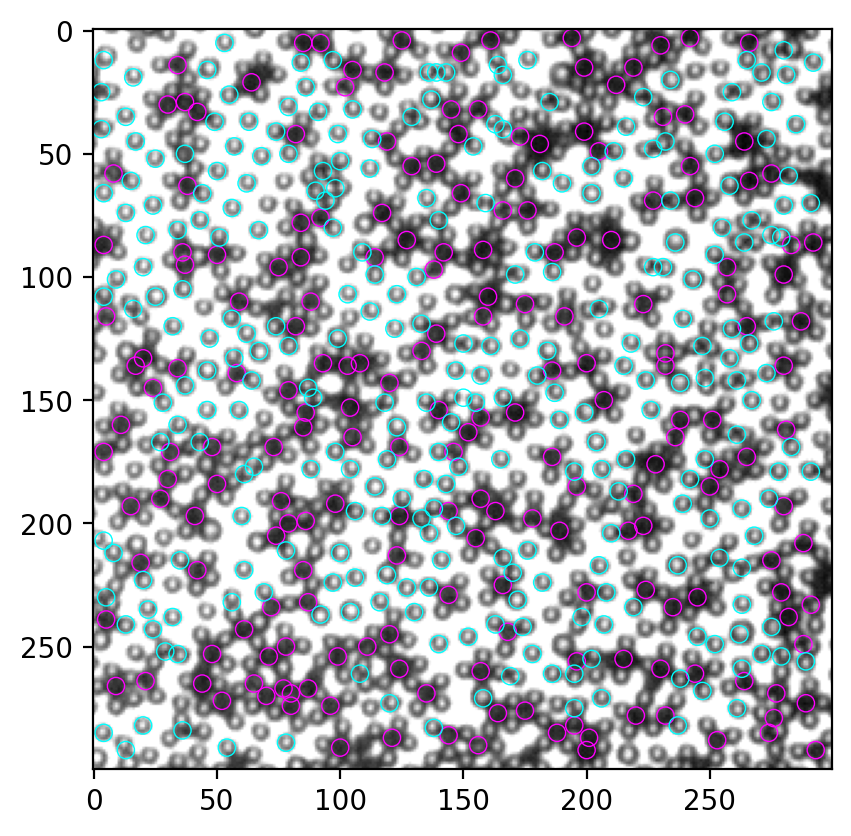

In [61]:
thres = 3500
black = particles.loc[particles.pv<=thres]
other = particles.loc[particles.pv>thres]

fig, ax = plt.subplots(dpi=200)
ax.imshow(img, cmap="gray")
for num, i in black.iterrows():
    circ = Circle((i.x, i.y), radius=3.5, ec="magenta", fill=False, lw=0.5)
    ax.add_patch(circ)
for num, i in other.iterrows():
    circ = Circle((i.x, i.y), radius=3.5, ec="cyan", fill=False, lw=0.5)
    ax.add_patch(circ)

# 3 寻找白色颗粒

尽管我们上一节找到了部分白色颗粒，但找到的数量大概不到总数的一半，还有提高的空间。这里尝试用Mexican hat为模板寻找。

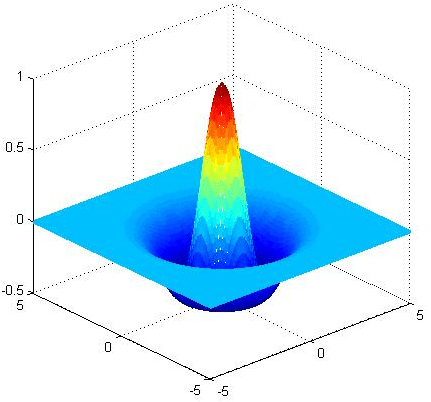

[Ricker wavelet](https://en.wikipedia.org/wiki/Ricker_wavelet)

In [75]:
# Generate a Mexican hat shape mask
def mexican_hat(shape=(3,3), sigma=1):
    """
    2D mexican hat mask
    """
    m, n = [(ss-1.)/2. for ss in shape]
    y, x = np.ogrid[-m:m+1,-n:n+1]
    h = 1 / np.pi / sigma ** 4 * (1 - (x*x + y*y) / (2*sigma*sigma)) * np.exp( -(x*x + y*y) / (2.*sigma*sigma) )
    sumh = h.sum()
    if sumh != 0:
        h /= sumh
    return h


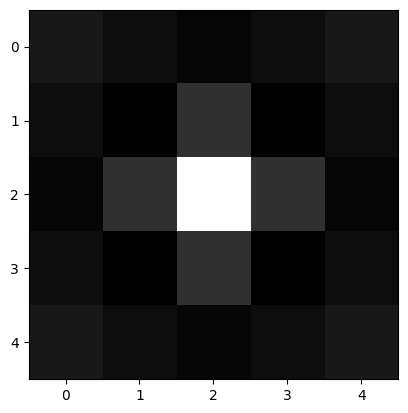

In [130]:
mh = mexican_hat(shape=(5,5), sigma=0.8)
plt.imshow(mh, cmap="gray")

我们重复第二节的流程：
- convolve image and mask
- correlate image and mask
- find peak in correlation map

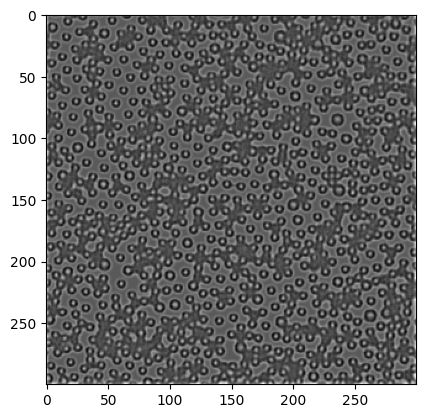

In [131]:
timg = convolve2d(img, mh, mode="same")
plt.imshow(timg, cmap="gray") 

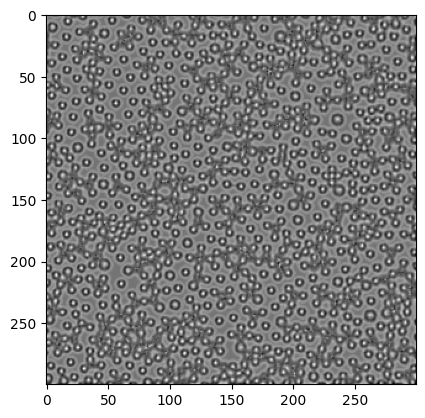

In [140]:
corr = normxcorr2(mh, img, "same")
plt.imshow(corr, cmap="gray")
io.imsave("corr.tif", corr)

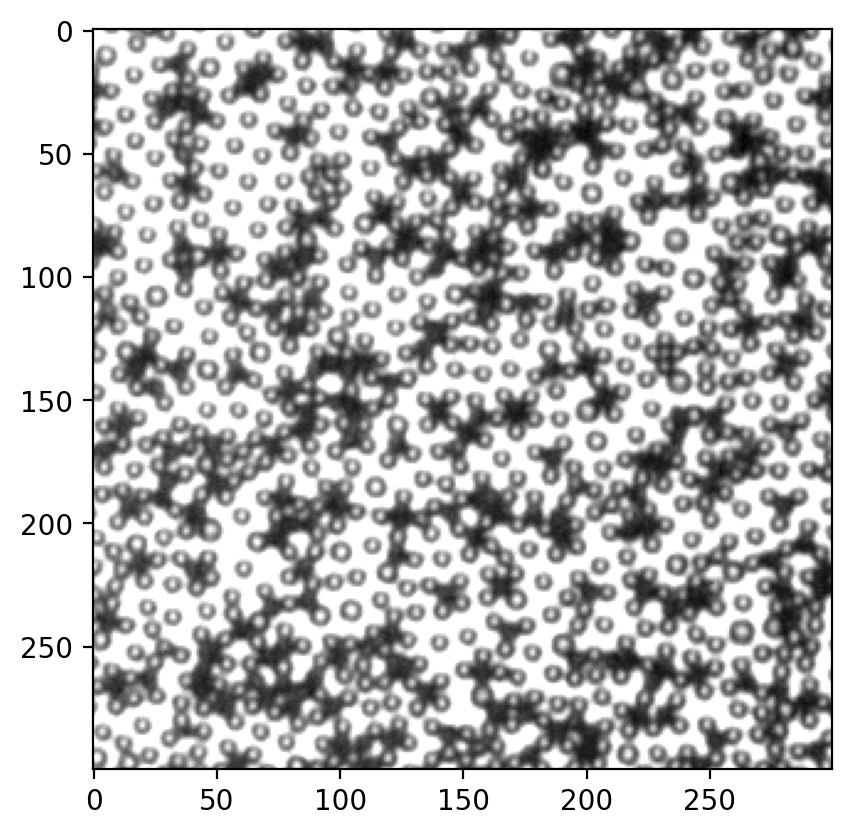

In [141]:
peak = FastPeakFind(-corr)
# corr = convolve2d(corr, gauss_mask)
fig, ax = plt.subplots(dpi=200)
ax.imshow(img, cmap="gray")
for y, x in peak.T:
    circ = Circle((x, y), radius=3.5, ec="magenta", fill=False, lw=0.5)
    ax.add_patch(circ)

不清楚为什么FaskPeakFind不好用。但是在correlation map上的白色particle肉眼都可以清楚看见。我截图在ImageJ里尝试找局部最大，效果如下：

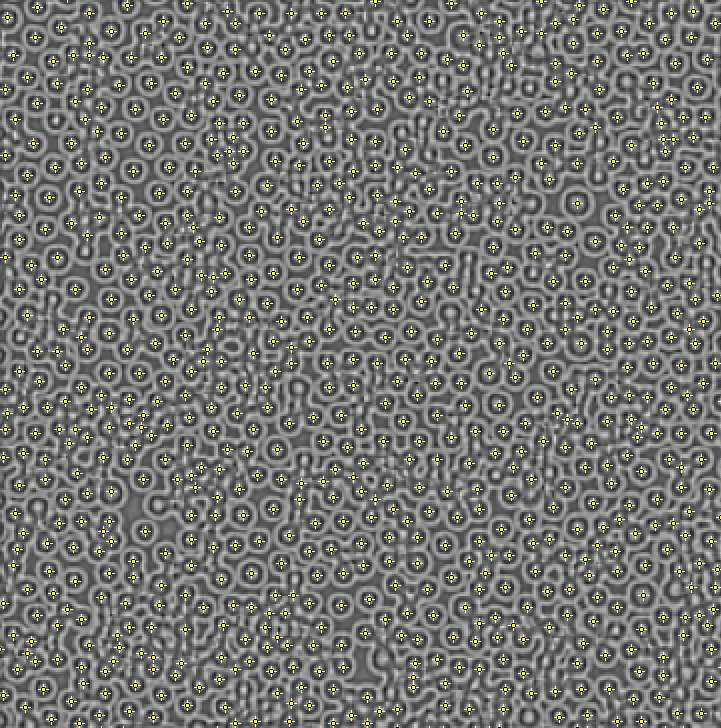

下面导入local maxima数据，画在原图上。

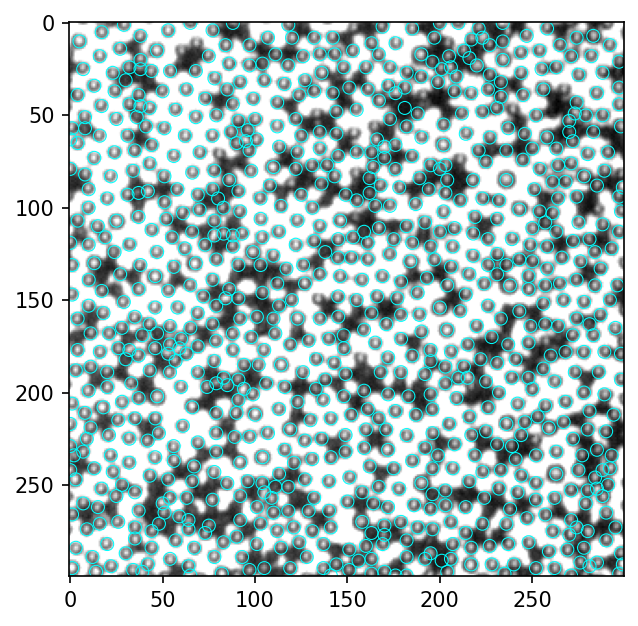

In [142]:
data = pd.read_csv("local_maxima.csv")
fig, ax = plt.subplots(dpi=150)
ax.imshow(img, cmap="gray")
for num, i in data.iterrows():
    circ = Circle((i.X, i.Y), radius=3.5, ec="cyan", fill=False, lw=0.5)
    ax.add_patch(circ)

看起来绝大部分的白色particle都找到了，至少是多余90%。这是在imagej里找local maxima的结果，需要调整一个参数“prominence”。这里尝试在用python复现local maxima。

In [154]:
from skimage.feature import peak_local_max
coordinates = peak_local_max(corr, min_distance=5)

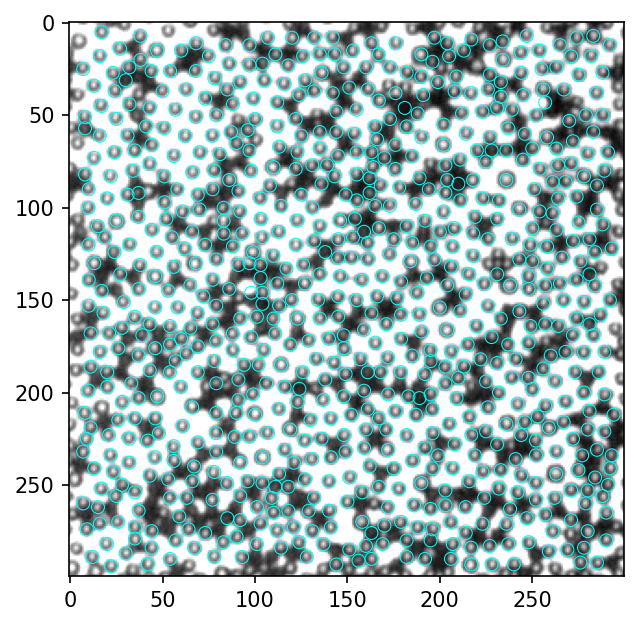

In [155]:
fig, ax = plt.subplots(dpi=150)
ax.imshow(img, cmap="gray")
for y, x in coordinates:
    circ = Circle((x, y), radius=3.5, ec="cyan", fill=False, lw=0.5)
    ax.add_patch(circ)

In [149]:
data.shape

(848, 3)

In [153]:
coordinates.shape

(973, 2)

ImageJ和Python的findmaxima效果都能接受，但ImageJ的更好。我试着找过有没有人把ImageJ的算法用python实现，[唯一找到的code](https://github.com/dwaithe/MaximaFinder)安装不了，我提交了一个issue看看能不能解决，现阶段就用`from skimage.feature import peak_local_max`。如果需要更好的结果，可以把图片处理好再用imagej找，比较麻烦，视需求决定。

## 4 全部流程整合

In [1]:
from skimage import io
import matplotlib.pyplot as plt
import numpy as np
from myImageLib import to8bit, matlab_style_gauss2D
from scipy.signal import convolve2d
from xcorr_funcs import normxcorr2, FastPeakFind
from matplotlib.patches import Circle
import pandas as pd
from skimage.feature import peak_local_max

(-0.5, 299.5, 299.5, -0.5)

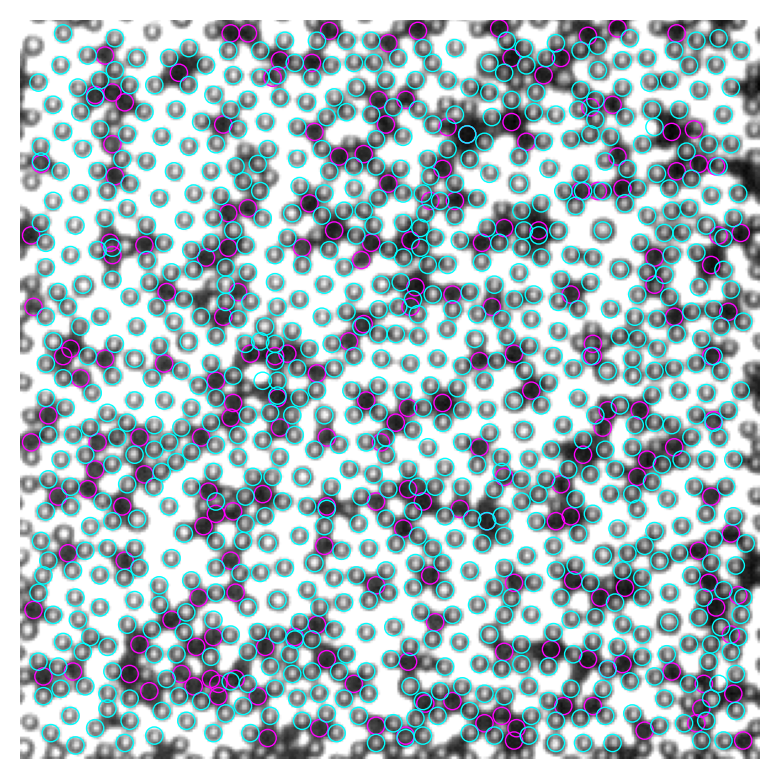

In [10]:
# find black particles
img = io.imread("try0000_imj.tif")
img = to8bit(img)
inv_img = 255 - img
gauss_mask = matlab_style_gauss2D(shape=(7,7),sigma=3.5) # 这里的shape是particle的直径，单位px
timg = convolve2d(inv_img, gauss_mask, mode="same") 
corr = normxcorr2(gauss_mask, timg, "same") # 找匹配mask的位置
peak = FastPeakFind(corr) # 无差别找峰
# 计算mask内的像素值之和
Y, X = np.mgrid[0:img.shape[0], 0:img.shape[1]] 
R = 3.5 
pixel_sum_list = []
for y, x in peak.T:
    mask = (X - x) ** 2 + (Y - y) ** 2 < R ** 2
    pv = img[mask].sum()
    pixel_sum_list.append(pv)
# 把数据装进一个DataFrame
particles = pd.DataFrame({"x": peak[1], "y": peak[0], "pv": pixel_sum_list})

thres = 3500 # 手动设定阈值
black = particles.loc[particles.pv<=thres]
other = particles.loc[particles.pv>thres]

#把黑色particle画在原图上
fig, ax = plt.subplots(dpi=200)
ax.imshow(img, cmap="gray")
for num, i in black.iterrows():
    circ = Circle((i.x, i.y), radius=3.5, ec="magenta", fill=False, lw=0.5)
    ax.add_patch(circ)
    
# 找白
def mexican_hat(shape=(3,3), sigma=1):
    """
    2D mexican hat mask
    """
    m, n = [(ss-1.)/2. for ss in shape]
    y, x = np.ogrid[-m:m+1,-n:n+1]
    h = 1 / np.pi / sigma ** 4 * (1 - (x*x + y*y) / (2*sigma*sigma)) * np.exp( -(x*x + y*y) / (2.*sigma*sigma) )
    sumh = h.sum()
    if sumh != 0:
        h /= sumh
    return h

mh = mexican_hat(shape=(5,5), sigma=0.8) # 这里shape和上面同理，sigma需要自行尝试一下，1左右
timg = convolve2d(img, mh, mode="same")
corr = normxcorr2(mh, img, "same")
coordinates = peak_local_max(corr, min_distance=5) 
for y, x in coordinates:
    circ = Circle((x, y), radius=3.5, ec="cyan", fill=False, lw=0.5)
    ax.add_patch(circ)
ax.axis("off")

## 5 黑色particle重合问题

图中找黑色particle多有重合，而实际上所有particle都在同一界面，必然不应重合。出现重合的原因是我们只寻找correlation map上的极值，而图像上的噪音会导致假极值的产生。我们可以通过设置一个particle最小间距来删除重合的particle，只保留距离足够远的particle。这种方法不能保证留下的都是效果好的。

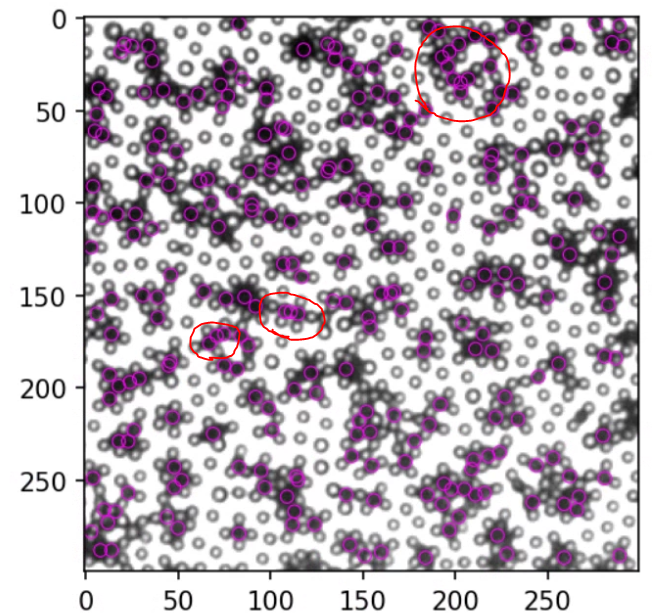

比如下面这张图，我们实际上有三个黑球，但程序找到6个，我们可以从左到右依次排除，假设第一个是准的，保留下来的就是第1,4,6个（下面第二张图）。

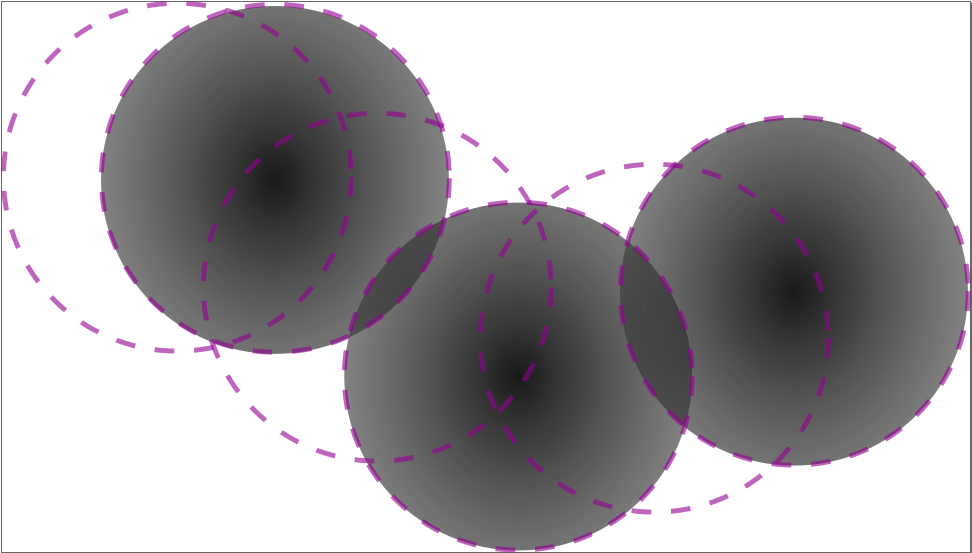
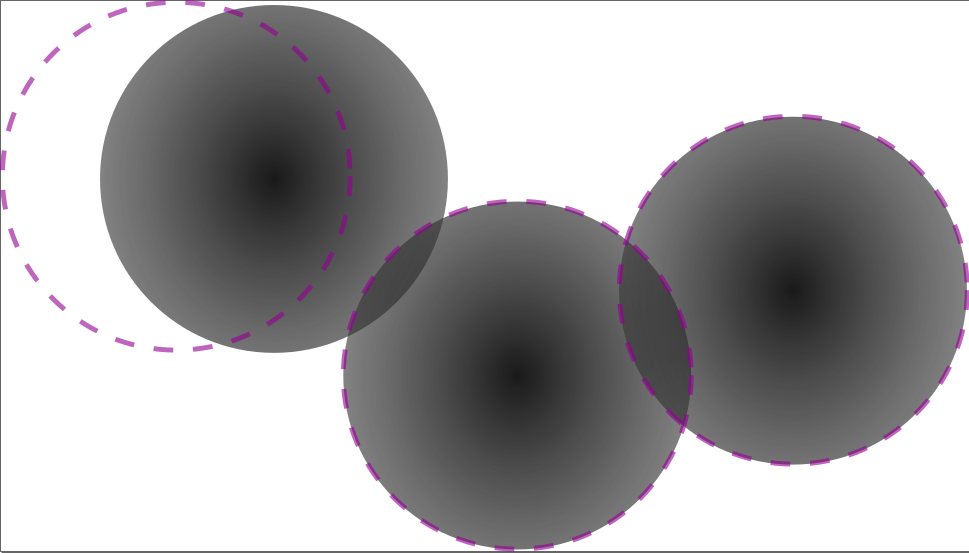

然而这样最左边那个就错了。比较科学的办法是，我们先把每个找到的球按照和mask的吻合程度，即correlation map上峰的高度从高到低排序，然后再依次删除和最高峰重合的，就可以提高寻找particle的质量。

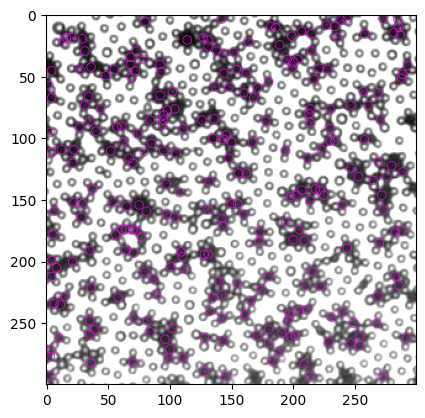

In [40]:
# 以视频中第40帧为例，先用老办法得到和乔哥邮件里相同的结果

# find black particles
img = io.imread("00040.tif")
img = to8bit(img)
inv_img = 255 - img
gauss_mask = matlab_style_gauss2D(shape=(7,7),sigma=3.5) # 这里的shape是particle的直径，单位px
timg = convolve2d(inv_img, gauss_mask, mode="same") 
corr = normxcorr2(gauss_mask, timg, "same") # 找匹配mask的位置
peak = FastPeakFind(corr) # 无差别找峰
# 计算mask内的像素值之和
Y, X = np.mgrid[0:img.shape[0], 0:img.shape[1]] 
R = 3.5 
pixel_sum_list = []
for y, x in peak.T:
    mask = (X - x) ** 2 + (Y - y) ** 2 < R ** 2
    pv = img[mask].sum()
    pixel_sum_list.append(pv)
# 把数据装进一个DataFrame
particles = pd.DataFrame({"x": peak[1], "y": peak[0], "pv": pixel_sum_list})

thres = 3500 # 手动设定阈值
black = particles.loc[particles.pv<=thres]
other = particles.loc[particles.pv>thres]

#把黑色particle画在原图上
fig, ax = plt.subplots()
ax.imshow(img, cmap="gray")
for num, i in black.iterrows():
    circ = Circle((i.x, i.y), radius=3.5, ec="magenta", fill=False, lw=0.5)
    ax.add_patch(circ)

然后尝试用最小距离删掉多余的particle，我们尝试两种思路：

1. 直接按从上到下、从左到右的顺序依次判断距离和删除particle
2. 用correlation map的峰值排序particle，然后从峰值最大的particle开始判断距离和删除

下面的function `min_dist_criterion` 已经整合了对峰值的判断。如果输入的coords中有peak一列，则使用思路2，否则使用思路1

In [43]:
def min_dist_criterion(coords, min_dist):
    """
    Use minimal distance criterion on a particle coordinate data. 
    
    :param coords: the coordinate data of particles, contains at least two columns (x, y). Optionally, a column (peak) can be included, as the order of the screening.
    :type coords: pandas.DataFrame
    :min_dist: minimal distance allowed between two detected particles.
    :type min_dist: int
    :return: screened coordinates, a subset of coords
    :rtype: pandas.DataFrame
    
    .. rubric:: Edit
    
    :Nov 16, 2022: Initial commit.    
    """
    xy = coords.copy() # create a copy of input DataFrame, just to avoid a warning from pandas
    
    if "peak" in xy: # if we have peak data, sort the data according to peak values
        xy.sort_values(by="peak", ascending=False, inplace=True)
    
    index_to_remove = []
    
    for num, i in xy.iterrows():
        if num not in index_to_remove: # already removed particle should not be considered again
            dist = ((xy.x - i.x) ** 2 + (xy.y - i.y) ** 2) ** 0.5 # distance between particle i and all other particles
            for ind in dist[dist < min_dist].index:
                if ind != num: # exclude itself, because the distance would always be 0, thus < min_dist
                    index_to_remove.append(ind)
    
    return xy.drop(index_to_remove) # drop all the recorded index, and return

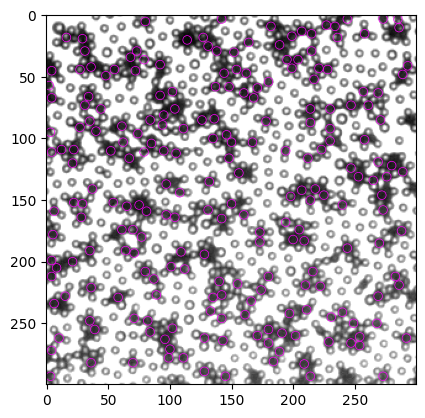

In [44]:
# 思路 1
t1 = min_dist_criterion(black, 7)
# plot
fig, ax = plt.subplots()
ax.imshow(img, cmap="gray")
for num, i in t1.iterrows():
    circ = Circle((i.x, i.y), radius=3.5, ec="magenta", fill=False, lw=0.5)
    ax.add_patch(circ)

结果已经有明显提高，所有重合的particle均被排除。但是，美中不足，我们失去了一些显然很好的particle，比如右上角的两个。

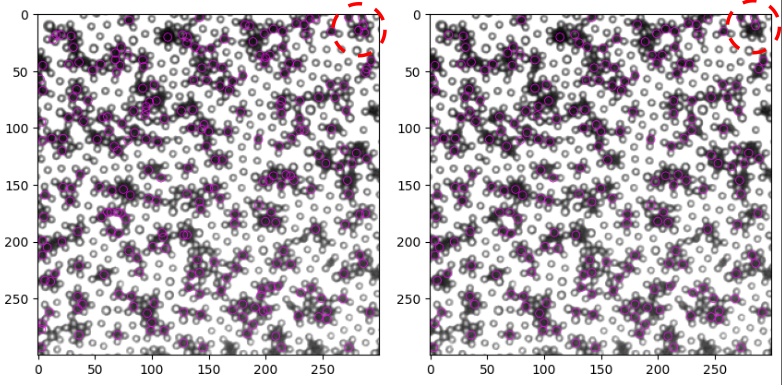

这种情况下，我猜测如果按peak排序后删除，效果会有提高。下面实现。

In [45]:
# 先把peak value加进particle detection data
black_wp = black.assign(peak=corr[black.y, black.x])

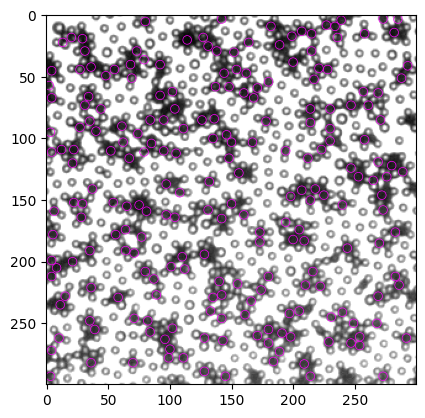

In [55]:
# 思路2
t2 = min_dist_criterion(black_wp, 7)
# plot
fig, ax = plt.subplots()
ax.imshow(img, cmap="gray")
for num, i in t2.iterrows():
    circ = Circle((i.x, i.y), radius=3.5, ec="magenta", fill=False, lw=0.5)
    ax.add_patch(circ)

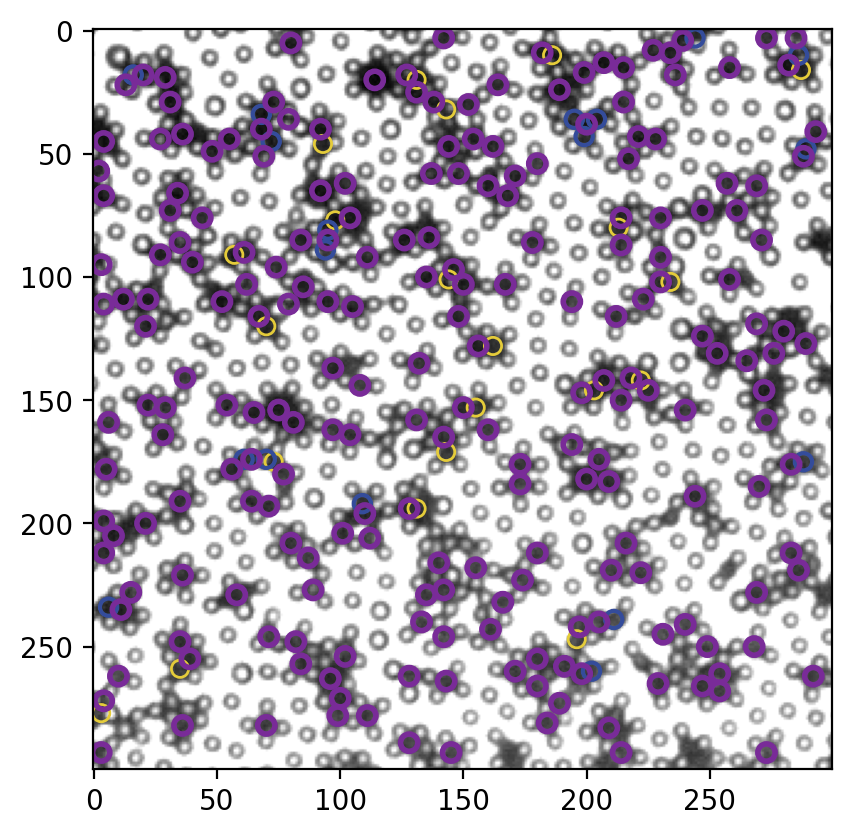

In [56]:
# 画到一张图上以便对比，黄色是最初的结果，蓝色是不考虑peak直接距离过滤的结果，紫色是考虑peak进行距离过滤的结果
fig, ax = plt.subplots(dpi=200)
ax.imshow(img, cmap="gray")
colors = ["#E5CC3A", "#344C9B", "#792B98"]
for num, i in black.iterrows():
    circ = Circle((i.x, i.y), radius=3.5, ec=colors[0], fill=False, lw=1)
    ax.add_patch(circ)
for num, i in t1.iterrows():
    circ = Circle((i.x, i.y), radius=3.5, ec=colors[1], fill=False, lw=1.5)
    ax.add_patch(circ)
for num, i in t2.iterrows():
    circ = Circle((i.x, i.y), radius=3.5, ec=colors[2], fill=False, lw=2)
    ax.add_patch(circ)

显著提高。

# 6 每个颗粒的Trajectory

这个就是trackpy的核心功能，把所有帧的x，y数据连接成trajectory。参考[trackpy doc](http://soft-matter.github.io/trackpy/v0.5.0/generated/trackpy.link.html#trackpy.link).

In [72]:
# 我们先得把每一帧的xy数据得到

# 把找黑球算法装进function

def find_black(img, size=7, thres=None):
    """
    Find black particles in 乔哥's image. 
    
    :param img: raw image to find particles in 
    :type img: 2d array
    :param size: diameter of particle (px)
    :type size: int
    :param thres: threshold for discerning black and white particles. By default, ``thres`` is inferred from the data as mean of the median and the mean of pixel sums of all the particles. However, it is preferred to set a threshold manually, with the knowledge of the specific data.
    :type thres: int
    :return: list of particle positions, pixel value sums and corr map peak values (x, y, pv, peak)
    :rtype: pandas.DataFrame
    
    .. rubric:: Edit
    
    :Nov 16, 2022: Initial commit.
    """
    img = to8bit(img) # convert to 8-bit and saturate
    inv_img = 255 - img
    
    # generate gaussian template according to particle size
    gauss_shape = (size, size)
    gauss_sigma = size / 2.   
    gauss_mask = matlab_style_gauss2D(shape=gauss_shape,sigma=gauss_sigma) # 这里的shape是particle的直径，单位px
    
    timg = convolve2d(inv_img, gauss_mask, mode="same") 
    corr = normxcorr2(gauss_mask, timg, "same") # 找匹配mask的位置
    peak = FastPeakFind(corr) # 无差别找峰
    
    # 计算mask内的像素值之和
    Y, X = np.mgrid[0:img.shape[0], 0:img.shape[1]] 
    R = size / 2.
    pixel_sum_list = []
    for y, x in peak.T:
        mask = (X - x) ** 2 + (Y - y) ** 2 < R ** 2
        pv = img[mask].sum()
        pixel_sum_list.append(pv)
        
    # 把数据装进一个DataFrame
    particles = pd.DataFrame({"x": peak[1], "y": peak[0], "pv": pixel_sum_list})
    # 加入corr map峰值，为后续去重合服务
    particles = particles.assign(peak=corr[particles.y, particles.x])
    
    if thres == None:
        thres = (particles.pv.median() + particles.pv.mean()) / 2
        
    return particles.loc[particles.pv <= thres]

In [66]:
# 找黑球
img = io.imread("00040.tif")
black = find_black(img, size=7)

(-0.5, 299.5, 299.5, -0.5)

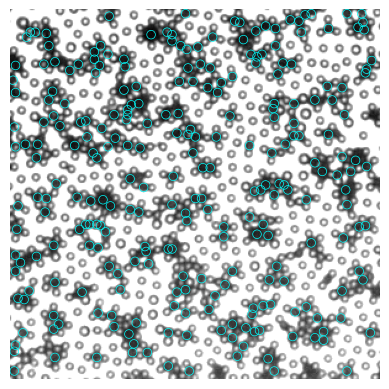

In [70]:
# plot
fig, ax = plt.subplots()
ax.imshow(img, cmap="gray")
for num, i in black.iterrows():
    circ = Circle((i.x, i.y), radius=3.5, ec="cyan", fill=False, lw=0.5)
    ax.add_patch(circ)
ax.axis("off")

In [73]:
# 去重合
remove_overlap = min_dist_criterion(black, 7)

(-0.5, 299.5, 299.5, -0.5)

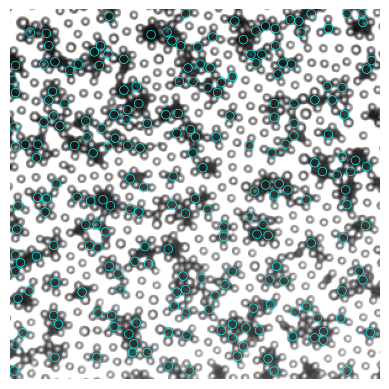

In [74]:
# plot
fig, ax = plt.subplots()
ax.imshow(img, cmap="gray")
for num, i in remove_overlap.iterrows():
    circ = Circle((i.x, i.y), radius=3.5, ec="cyan", fill=False, lw=0.5)
    ax.add_patch(circ)
ax.axis("off")

In [76]:
# 整个video，我保存成tif sequence放在video文件夹
from myImageLib import readdata
l = readdata("video", "tif")

t = [] # data container
for num, i in l.iterrows():
    print("frame {:03d}".format(num))
    img = io.imread(i.Dir)
    black = find_black(img, size=7)
    remove_overlap = min_dist_criterion(black, 7)
    remove_overlap_frame = remove_overlap.assign(frame=num) # add a column for frame number
    t.append(remove_overlap_frame)
particles = pd.concat(t, axis=0)

C:\Users\liuzy\Documents\Github\mylib\xcorr_funcs.py:42: RuntimeWarning: divide by zero encountered in divide
  out = out / np.sqrt(image * template)
C:\Users\liuzy\Documents\Github\mylib\xcorr_funcs.py:42: RuntimeWarning: divide by zero encountered in divide
  out = out / np.sqrt(image * template)
C:\Users\liuzy\Documents\Github\mylib\xcorr_funcs.py:42: RuntimeWarning: divide by zero encountered in divide
  out = out / np.sqrt(image * template)


In [78]:
particles.head() # 注意这里的index没有任何意义

,x,y,pv,peak,frame
121,181,85,1872,0.974025,0
383,79,282,2536,0.960191,0
148,170,103,1838,0.950044,0
225,34,164,1717,0.946698,0
195,43,141,2392,0.941322,0


In [79]:
import trackpy as tp

traj = tp.link(particles, 10, memory=5)

Frame 59: 196 trajectories present.


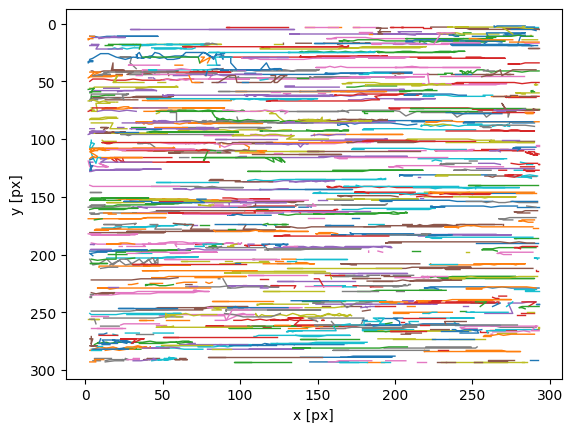

<AxesSubplot:xlabel='x [px]', ylabel='y [px]'>

In [80]:
tp.plot_traj(traj)

大概是这么个样子，所有particle都横着走。也可以看看video。我这电脑上运行很慢，大概3秒1帧，你可以把所以图片保存然后拖到FIJI里看。

In [85]:
# make animated visualization of the trajectories

# assign a color to each trajectory
tab20 = plt.cm.get_cmap("tab20")
color_mapper = {}
for num, i in enumerate(traj.particle.drop_duplicates()):
    color_mapper[i] = tab20(num%20)

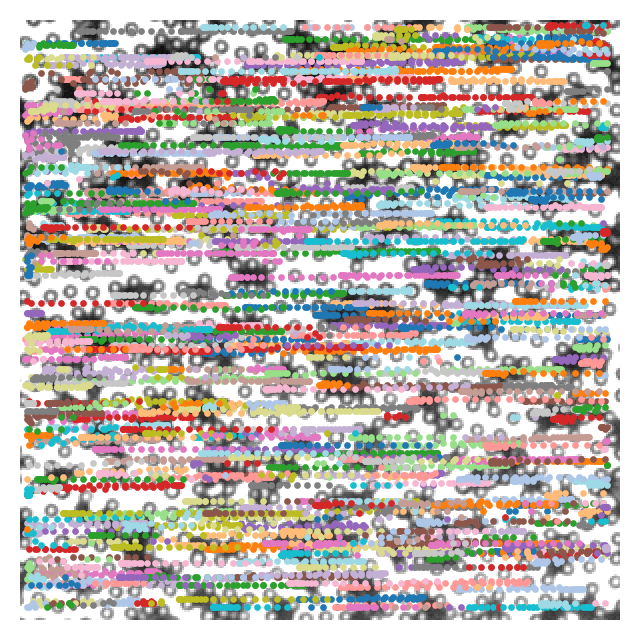

In [90]:
# save_folder = r"C:\Users\liuzy\Documents\07282022"
from IPython.display import clear_output
import os
mpp = 1
for frame in traj.frame.drop_duplicates():    
    subtraj = traj.loc[(traj.frame <= frame)&(traj.frame>max(frame-100, 0))]
    bg = io.imread(os.path.join("video", "{:05d}.tif".format(frame)))
    fig = plt.figure(figsize=(bg.shape[1]/100, bg.shape[0]/100), dpi=200)
    ax = fig.add_axes([0,0,1,1])
    ax.imshow(bg, cmap="gray")
    for i, g in subtraj.groupby("particle"):
        ax.scatter(g.x/mpp, g.y/mpp, color=color_mapper[i], s=2)
        # ax.annotate(i, (g.x.iloc[-1]/mpp, g.y.iloc[-1]/mpp), color="yellow", fontsize=8, horizontalalignment="center", verticalalignment="center")
    ax.axis("off")
    # fig.savefig(os.path.join(save_folder, "visualize-traj", "{:04d}.jpg".format(frame)))  
    plt.pause(.1)
    plt.close(fig)
    clear_output(wait=True)

一般来说，`tp.link`之后还要删掉很短的trajectory，因为他们一般都是错的，这个要用`tp.filter_stubs()`。可以看看[doc](http://soft-matter.github.io/trackpy/v0.5.0/generated/trackpy.filtering.filter_stubs.html#trackpy.filtering.filter_stubs)

In [92]:
# 删掉少于10帧的trajactories
traj_filtered = tp.filter_stubs(traj, 10)

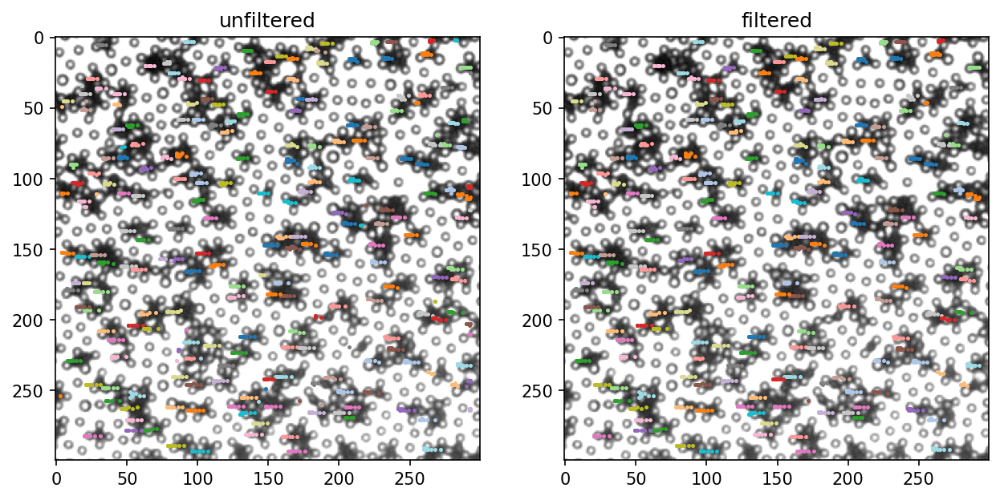

In [98]:
# 效果预览
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 5), dpi=150)
titles = ["unfiltered", "filtered"]
count = 0
for t in [traj, traj_filtered]:
    subtraj = t.loc[(t.frame <= 60)&(t.frame>50)]
    bg = io.imread(os.path.join("video", "{:05d}.tif".format(frame)))
    ax[count].set_title(titles[count])
    ax[count].imshow(bg, cmap="gray")
    for i, g in subtraj.groupby("particle"):
        ax[count].scatter(g.x/mpp, g.y/mpp, color=color_mapper[i], s=2)
    count += 1

仔细对比上面两张图可以看出作用。

## 7 Subpixel accuracy

目前，我们的xy都是整数，即都是完整的pixel。要得到更精确的particle位置，我们需要以这些整数为初值，进行Gaussian fitting。

In [489]:
def gauss2(x, a, x0, y0, sigma, b):
    """
    Define a two dimensional Gaussian function. Note that it is symetric in x and y, so we only need one sigma. 
    
    .. math::
    
       g(x, y) = a \exp(-\frac{(x-x_0)^2 + (y-y_0)^2}{2\sigma^2}) + b
    
    :param x: [N x 2] input data, consisting of two columns. The first column ``x[:, 0]`` represents x, the second column ``x[:, 1]`` represents y.
    :param a,x0,y0,sigma,b: constants in the Gaussian, see the formula above.
    :return: [N x 1] values of the Gaussian
    """
    
    return a * np.exp(-((x[:, 0]-x0)**2 + (x[:, 1]-y0)**2) / 2 / sigma**2) + b

In [643]:
img = io.imread("00040.tif")
img8 = to8bit(img)
inv_img = 255 - img8
size = 7

In [752]:
# 先把图片Gaussian smooth一下，因为峰太平不太容易用Gaussian fitting
gauss_mask = matlab_style_gauss2D(shape=(size, size), sigma=size/2)
gimg = convolve2d(inv_img, gauss_mask, mode="same") 

In [645]:
p = find_black(img, size)
p = min_dist_criterion(p, size)

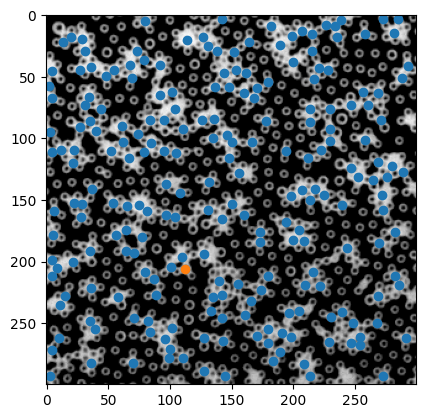

In [802]:
i = 50 # test one particle
x0, y0 = p.x.iloc[i], p.y.iloc[i]
plt.imshow(inv_img, cmap="gray")
plt.scatter(p.x, p.y)
plt.scatter(x0, y0)

In [803]:
# prepare data to be fitted: x should be [N x 2] array of the coordinates, y should be [N x 1] array of the corresponding pixel values
# for the first detected particle, as indicated in the above picture the orange disc
d = size # set fitting range
X, Y = np.mgrid[max(x0-d, 0): min(x0+d, img.shape[1]), max(y0-d, 0):min(y0+d, img.shape[0])]
# confine the fitting range to a circle, instead of a rectangle
ind = (X - x0) ** 2 + (Y - y0) ** 2 <= (d/2) ** 2
X = X[ind]
Y = Y[ind]

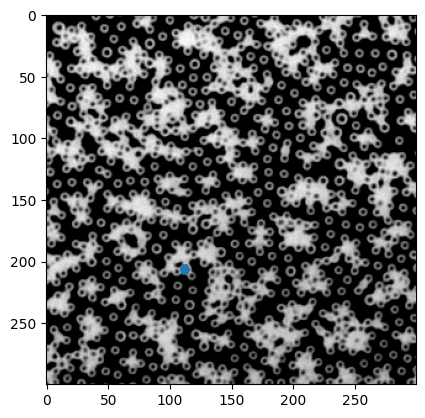

In [804]:
# 这里的X，Y取了x0，y0周围的一个边长为两倍particle尺寸方形区域，超出图片外的部分直接砍掉
plt.imshow(inv_img, cmap="gray")
plt.scatter(X, Y, s=1)

In [805]:
# 把X，Y和对应的像素值整理成fitting所需要的格式
x = np.stack([X.flatten(), Y.flatten()], axis=1)
y = gimg[x[:, 0], x[:, 1]]

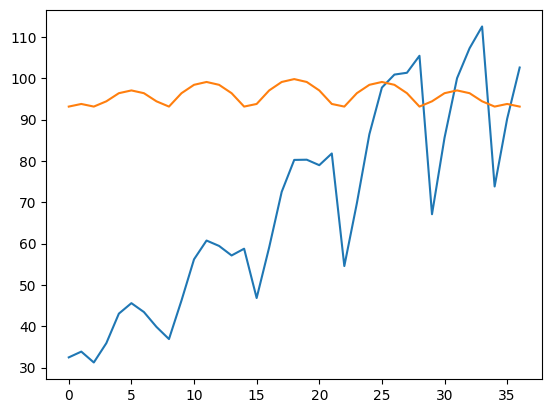

In [806]:
# 猜一个初值
plt.plot(y)
plt.plot(gauss2(x, *[y.mean(), x0, y0, size, y.min()]))

In [807]:
from scipy.optimize import curve_fit
popt, pcov = curve_fit(gauss2, x, y, p0=[y.mean(), x0, y0, size, y.min()], bounds=([0, x0-1, y0-1, -np.inf, 0], [y.max(), x0+1, y0+1, np.inf, y.max()]))

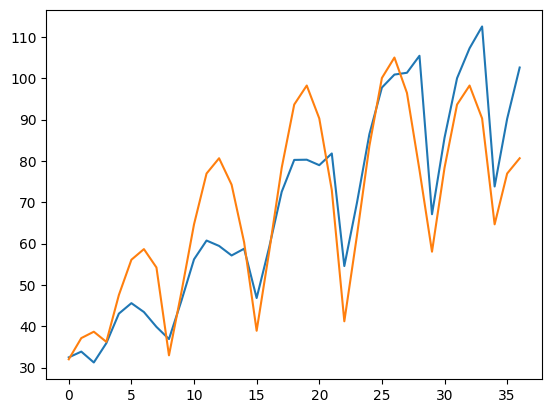

In [808]:
# The fitting actually does not work so well, indicating that we
plt.plot(y)
plt.plot(gauss2(x, *popt))

In [809]:
x0, y0

(112, 206)

In [810]:
popt

array([ 96.46380011, 113.        , 206.86174804,  -2.61939087,
         8.67380856])

(213.0, 199.0)

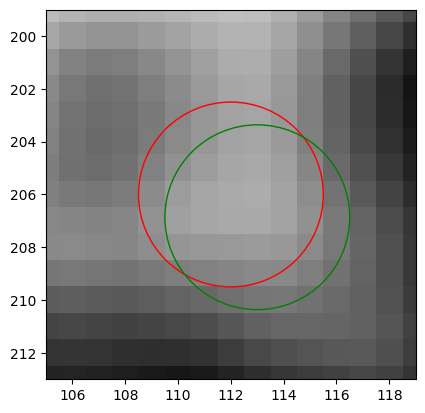

In [811]:
# 对比矫正前后的结果
fig, ax = plt.subplots()
ax.imshow(gimg, cmap="gray")
circ = Circle((x0, y0), size/2, color="red", fill=False, lw=1)
ax.add_patch(circ)
circ = Circle((popt[1], popt[2]), size/2, color="green", fill=False, lw=1)
ax.add_patch(circ)
ax.set_xlim([x0-d, x0+d])
ax.set_ylim([y0+d, y0-d])

由于图像本身精度不够，算法也不够只能，所以微调的效果不是很棒。这里把暂时的结果放进function，把调整的范围限制在$\pm 1$ px以内，不会对原始结果造成太大影响。

In [819]:
def subpixel_correction(p, img, size):
    """
    Obtain subpixel accuracy by fitting the 2D image with a Gaussian.
    
    :param p: particle coordinates data, (x, y, ...)
    :type p: pandas.DataFrame
    :param img: the image used for the final correlation computation. For example, in :py:func:`find_black`, it is the inverted image which subsequently convolved with a Gaussian mask.
    :type img: 2D array
    :param size: size of particle (px)
    :type size: int
    :return: corrected particle coordinates data, in the same format as p.
    :rtype: pandas.DataFrame
    """
    d = size # set fitting range
    p_sc = p.copy()
    for num, i in p.iterrows():
        x0, y0 = i.x, i.y
        X, Y = np.mgrid[max(x0-d, 0): min(x0+d, img.shape[1]), max(y0-d, 0):min(y0+d, img.shape[0])]
        # confine the fitting range to a circle, instead of a rectangle
        ind = (X - x0) ** 2 + (Y - y0) ** 2 <= (d/2) ** 2
        X = X[ind]
        Y = Y[ind]
        # 把X，Y和对应的像素值整理成fitting所需要的格式
        x = np.stack([X.flatten(), Y.flatten()], axis=1).astype("int")
        y = img[x[:, 0], x[:, 1]]
        # fit, use bounds to restrict the fitting, so that it does not go too far off
        # sometimes, the fitting does not work and can raise error, therefore, we enclose this line in a try except statement
        # if fitting fails, use the original coords
        try:
            popt, pcov = curve_fit(gauss2, x, y, p0=[y.mean(), x0, y0, size, y.min()], 
                                   bounds=([0, x0-1, y0-1, -np.inf, 0], [y.max(), x0+1, y0+1, np.inf, y.max()]))
            p_sc.at[num, "x"] = popt[1]
            p_sc.at[num, "y"] = popt[2]
        except:
            pass
    return p_sc

In [820]:
# 测试效果
img = io.imread("00040.tif")
p = find_black(img, size)
p = min_dist_criterion(p, size)
p_sc = subpixel_correction(p, img, 7)

In [827]:
p_sc.head()

,x,y,pv,peak
164,83.000000,86.00000,1381,0.947973
272,54.772860,153.00000,2028,0.938941
423,239.000000,242.00000,2974,0.937285
292,28.510384,164.36492,1701,0.936922
286,7.000000,158.00000,2474,0.923999


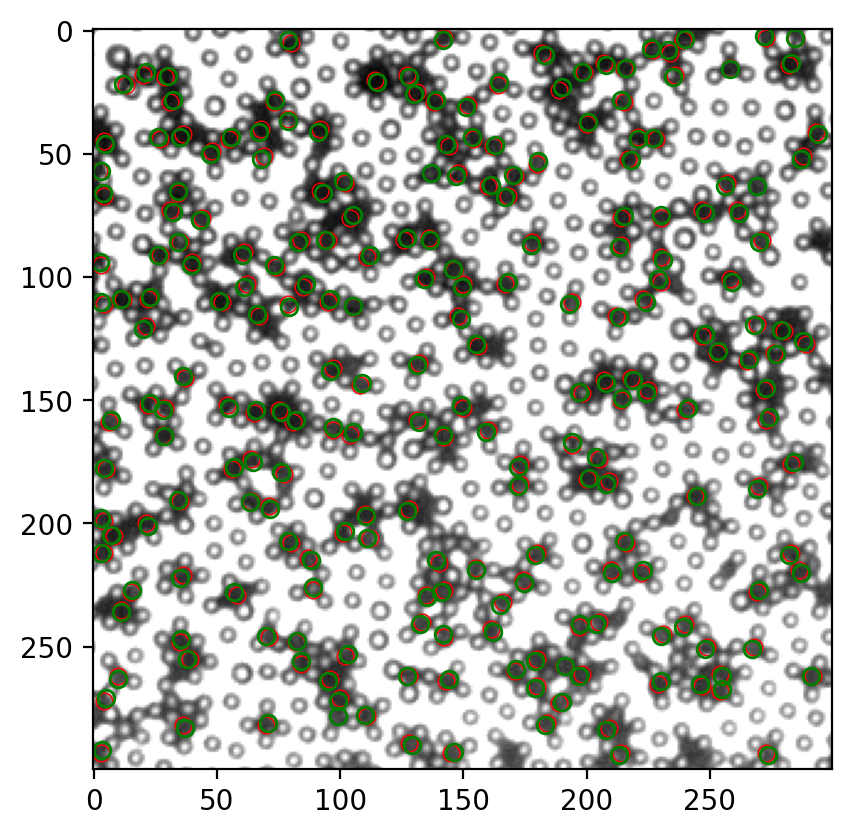

In [826]:
plt.figure(dpi=200)
plt.imshow(img, cmap="gray")
plt.scatter(p.x, p.y, fc=(0,0,0,0), ec="red", lw=0.5)
plt.scatter(p_sc.x, p_sc.y, fc=(0,0,0,0), color="green", lw=1)

很难评价有没有意义。

## Appendix: attempt to remove background inhomogeneity, no success

It's not working very well since we only have 60 frames of video. If we have longer video I expect better performance of this background subtraction. Let's try bpass.

In [607]:
# let's try to remove the background long wavelength light inhomogeneity 
l = readdata("video", "tif")
img_list = []
for num, i in l.iterrows():
    img = io.imread(i.Dir)
    img_list.append(img)
stack = np.stack(img_list, axis=0)
med = np.median(stack, axis=0)

In [609]:
img = stack[39] / med

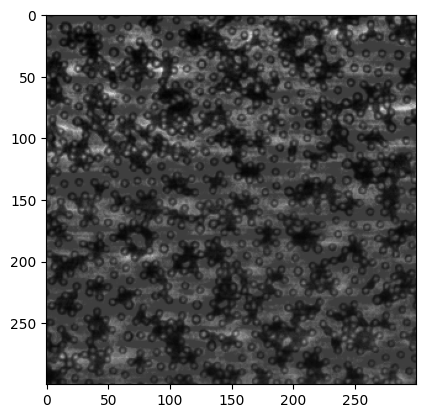

In [611]:
plt.imshow(img, cmap="gray")

In [614]:
from myImageLib import bpass

img = io.imread("00040.tif")
bp = bpass(img, 2, 100)

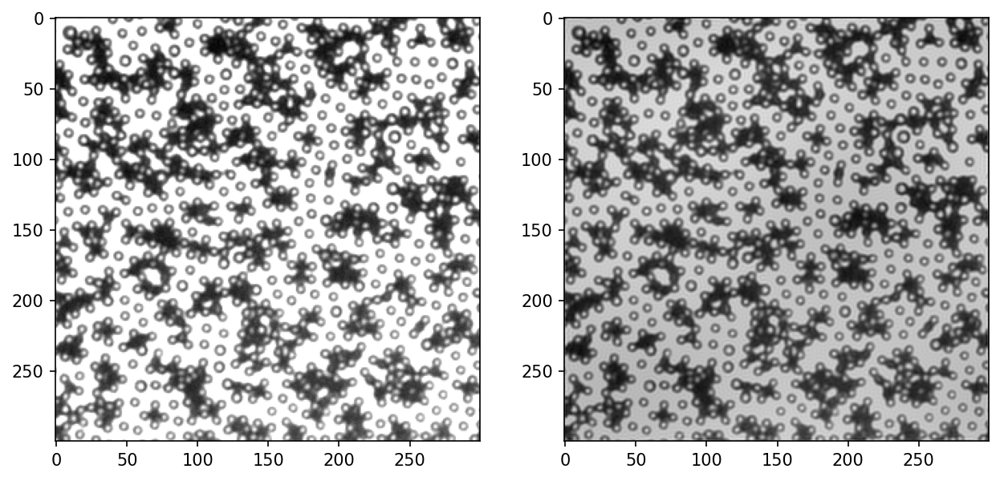

In [617]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 5), dpi=150)
ax[0].imshow(img, cmap="gray")
ax[1].imshow(bp, cmap="gray")

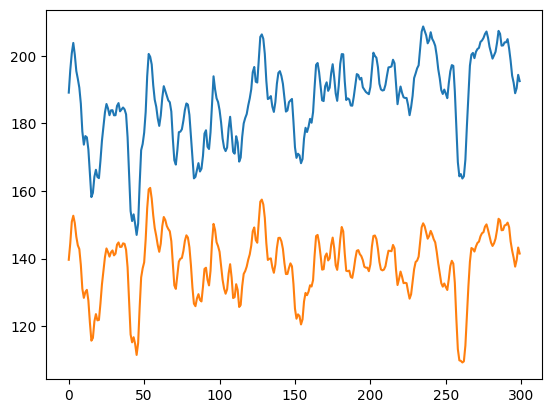

In [634]:
plt.plot(img.mean(axis=1))
plt.plot(bp.mean(axis=1))

I notice that the lower left corner is generally brighter, and upper right is darker in the raw image. In the bpass image, the background is more uniform. Let's look at the intensity profiles again. 

In [618]:
x0, y0 = p.x.iloc[10], p.y.iloc[10]

In [681]:
# prepare data to be fitted: x should be [N x 2] array of the coordinates, y should be [N x 1] array of the corresponding pixel values
# for the first detected particle, as indicated in the above picture the orange disc
d = size # set fitting range
X, Y = np.mgrid[max(x0-d, 0): min(x0+d, img.shape[1]), max(y0-d, 0):min(y0+d, img.shape[0])]
# confine the fitting range to a circle, instead of a rectangle
ind = (X - x0) ** 2 + (Y - y0) ** 2 <= (d/2) ** 2
# X = X[ind]
# Y = Y[ind]

In [682]:
x = np.stack([X.flatten(), Y.flatten()], axis=1)
y = bp[x[:, 0], x[:, 1]]
y_raw = img[x[:, 0], x[:, 1]]

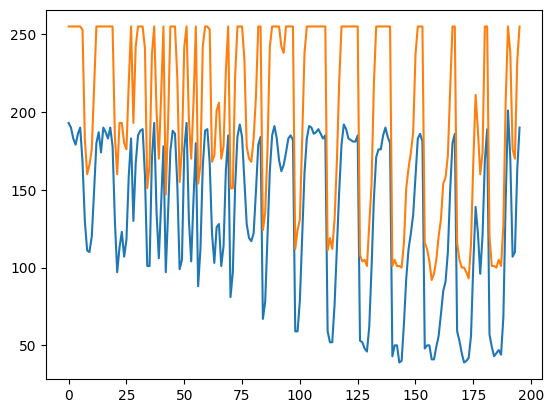

In [683]:
plt.plot(y)
plt.plot(y_raw)

In [753]:
inv_bp = 255 - bp
ginv_bp = convolve2d(inv_bp, gauss_mask, mode="same")
inv_img = 255 - img
ginv_img = convolve2d(inv_img, gauss_mask, mode="same")

In [754]:
bp_inv_img = bpass(inv_img, 5, 200)
gbp_inv_img = convolve2d(bp_inv_img, gauss_mask, mode="same")

In [755]:
x = np.stack([X.flatten(), Y.flatten()], axis=1)
y = ginv_bp[x[:, 0], x[:, 1]]
y_raw = ginv_img[x[:, 0], x[:, 1]]
y2 = gbp_inv_img[x[:, 0], x[:, 1]]

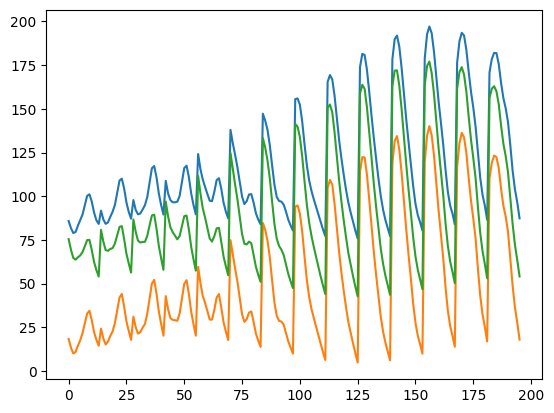

In [756]:
plt.plot(y)
plt.plot(y_raw)
plt.plot(y2)